In [2]:
!pip install pytorch-lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 831.6/831.6 kB 57.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 67.0 MB/s eta 0:00:00


In [3]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import os
import cv2
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import random
import torch.optim as optim
import matplotlib.pyplot as plt
torch.manual_seed(42)
import numpy as np
from PIL import Image
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torchvision.datasets import MNIST
import cv2 as cv
from google.colab.patches import cv2_imshow
import pytorch_lightning as pl
from pytorch_lightning import LightningDataModule, LightningModule, Trainer

# Generating Images

The main focus of this lab will be generative models. The goal of a generative model is to learn how to generate an image from a low-dimensional input code called a latent code. There exists many approches for image generation such as auto-encoders, Generative Adversarial Networks (GAN) or even diffusion models.

In recent years, generative models have achieve ground-breaking performances in multiple applications in industry (NFT Creation, Virtual Try Outs, Deep Fake Generation..). You might have heard of such success in caption to image generation with diffusion models such as [MidJourney](https://www.midjourney.com/) or [Stable Diffusion](https://huggingface.co/spaces/stabilityai/stable-diffusion).

Goal of this lab :
* Hands on Generative Models
* Solidify your knowledge in Deep Learning
* Use someone else's code
* Reuse Pytorch Lightning
* Have an Insight of industrial application of AI

## Back to the Basics : AutoEncoders

First, we are going to start from the simplest approach to image generation: auto-encoders. As you might remember, we used an AutoEncoder in your 2nd year labs to recreate some input images for compression purposes. In this part, we will reconstruct data from the MNIST Dataset.


### Lightning DataModule

We will reuse the MNIST datamodule used in the first lab. So just run the following cell.

In [4]:
class MNISTDataModule(pl.LightningDataModule):
    def __init__(self, batch_size):
        super().__init__()
        self.transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
        self.data_dir = ''
        self.batch_size = 32

    def prepare_data(self):
        # This method is used to download beforehand the dataset if needed.
        MNIST(self.data_dir, train=True, download=True)
        MNIST(self.data_dir, train=False, download=True)

    def setup(self, stage):
        # First stage is 'fit' (or None)
        if stage == "fit" or stage is None:
            # We create a validation split to watch the training.
            mnist_train_dataset = MNIST(self.data_dir, train=True, transform=self.transform)
            self.train_size = int(0.8 * len(mnist_train_dataset))
            self.valid_size = len(mnist_train_dataset) - self.train_size
            self.mnist_train, self.mnist_valid =  torch.utils.data.random_split(mnist_train_dataset, [self.train_size, self.valid_size])
        # Second stage is 'test'
        if stage == "test" or stage is None:
            self.mnist_test = MNIST(self.data_dir, train=False, transform=self.transform)

    def train_dataloader(self):
        return DataLoader(self.mnist_train, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.mnist_valid, self.batch_size, shuffle=True)

    def test_dataloader(self):
        return DataLoader(self.mnist_test,self.batch_size, shuffle=True)

### Lightning Module

#### AutoEncoder : Creating and Using a Latent Space

<img src="https://miro.medium.com/max/600/1*nqzWupxC60iAH2dYrFT78Q.png">

Reminder : An AutoEncoder is composed of an Encoder and a Decoder. The Encoder creates a representation of the input datas, called latent space. The Decoder uses the latent space representation of the Input to reconstruct it.

As we can see from the figure, the main goal of this model will be to learn a compact representation (latent code) of the training distribution images. Using the decoder, we can then retrieve the image from this code with low error.

We provide you with a code of an AutoEncoder class.
* **Using the given code, create an AutoEncoder composed of 3 stacks.**

In [5]:

class ConvDown(nn.Module):
  def __init__(self, in_channels, out_channels):
      super(ConvDown, self).__init__()
      self.in_channels = in_channels
      self.out_channels = out_channels
      self.model = nn.Sequential(nn.Conv2d(in_channels = self.in_channels,
                                            out_channels = self.out_channels,
                                            kernel_size = 3,
                                            stride = 1,
                                            padding = 0,
                                            dilation = 1),
                                  nn.BatchNorm2d(self.out_channels),
                                  nn.Dropout2d(0.5),
                                  nn.LeakyReLU(0.2))
  def forward(self,x):
      return self.model(x)

class ConvUp(nn.Module):
  def __init__(self, in_channels, out_channels):
      super(ConvUp, self).__init__()
      self.in_channels = in_channels
      self.out_channels = out_channels
      self.model = nn.Sequential(nn.ConvTranspose2d(in_channels = self.in_channels,
                                      out_channels = self.out_channels,
                                      kernel_size = 3,
                                      stride = 1,
                                      padding = 0,
                                      dilation = 1),
                    nn.LeakyReLU(0.2))
  def forward(self,x):
      return self.model(x)

class Encoder(nn.Module):
  def __init__(self, in_channels, number_of_stack):
    super(Encoder, self).__init__()
    self.in_channels = in_channels
    self.number_of_stack = number_of_stack
    channels = [in_channels]+ [2**i for i in range(3,10)]
    self.encoder = nn.ModuleList([ConvDown(channels[i], channels[i+1]) for i in range(number_of_stack)])

  def forward(self, x):
    for i, layer in enumerate(self.encoder):
      x = layer(x)
    return x

class Decoder(nn.Module):
  def __init__(self, out_channels,number_of_stack ):
    super(Decoder, self).__init__()
    channels = [out_channels]+ [2**i for i in range(3,10)]
    self.decoder = nn.ModuleList([ConvUp(channels[i+1], channels[i]) for i in range(number_of_stack)])[::-1]

  def forward(self, x):
    for i, layer in enumerate(self.decoder):
      x = layer(x)
    return x

############################################## TODO ##############################################
class AutoEncoder(nn.Module):
  def __init__(self, in_channels, number_of_stack):
    super().__init__()
    self.in_channels = in_channels
    self.number_of_stack = number_of_stack
    self.encoder = Encoder(self.in_channels, number_of_stack)
    self.decoder = Decoder(self.in_channels, number_of_stack)

  def forward(self, x):
    # TODO : Define your forward
    latent_representation = self.encoder(x)
    reconstructed_image = self.decoder(latent_representation)
    return reconstructed_image

# TODO : Create a model composed of 3 stacks
model = AutoEncoder(in_channels=3,number_of_stack=3)



*   Create your Lightning Module



In [6]:
class AutoEncoderPL(pl.LightningModule):
    def __init__(self, in_channels, number_of_stack):
        super().__init__()
        self.save_hyperparameters()
        # TODO : Define your model here.
        self.model = AutoEncoder(in_channels=self.hparams.in_channels, number_of_stack=self.hparams.number_of_stack)


        self.loss = nn.MSELoss()
        self.validation_outputs = []
        self.test_outputs = []

    def forward(self,x):
        # TODO : Send the input through your model
        return self.model(x)

    def configure_optimizers(self):
        # Choose your optimizer
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        # Define your Training Step
        # This method is pretty much similar to what your did in the first lab to train your model.
        x,y = train_batch
        x_reconstructed = self(x)
        loss = self.loss(x_reconstructed, x)
        # Don't remove the next line, you will understand why later
        self.log('train_loss', loss)
        return loss

    def validation_step(self, val_batch, batch_idx):
        # Define your Validation Step
        # What is the difference between the Training and the Validation Step ?
        x,y = val_batch
        x_reconstructed = self(x)
        loss = self.loss(x_reconstructed, x)
        self.log('val_loss', loss)
        self.validation_outputs.append({'loss': loss})
        return {'loss':loss}

    def test_step(self, test_batch, batch_idx):
        # Define your Test Step
        # What is the difference between the Training, Validation and Test Step ?
        x,y = test_batch
        x_reconstructed = self(x)
        loss = self.loss(x_reconstructed, x)
        # Don't remove the next line, you will understand why later
        self.log('test_loss', loss)
        self.test_outputs.append({'loss': loss})
        return {'loss':loss}

    # TODO : Do we have to add some functions (test_epoch_start, test_epoch_end..) to compute a reconstruction metric ?
    def on_validation_epoch_end(self):
        total_loss = torch.stack([x['loss'] for x in self.validation_outputs]).mean()
        self.log('val_loss_epoch', total_loss)
        self.validation_outputs.clear()

    def on_test_epoch_end(self):
        total_loss = torch.stack([x['loss'] for x in self.test_outputs]).mean()
        self.log('test_loss_epoch', total_loss)
        self.test_outputs.clear()

#### Training

##### Launch the Training

In [ ]:
# TODO :
model = AutoEncoderPL(in_channels=1, number_of_stack=3)
dm = MNISTDataModule(batch_size=32)
trainer = pl.Trainer(accelerator='auto', devices=1, max_epochs=10, logger=pl.loggers.TensorBoardLogger(save_dir="/content/tb_logs", name="my_model"))
trainer.fit(model, dm)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
100%|██████████| 9.91M/9.91M [00:00<00:00, 12.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 355kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.17MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 13.1MB/s]
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type        | Params | Mode 
----------------------------------------------
0 | model | AutoEncoder | 11.9 K | train
1 | loss  | MSELoss     | 0      | train
----------------------------------------------
11.9 K    Trainable params


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


#### Testing

Test some images from the testing dataset to verify that your model works.

In [ ]:
# TODO : Load your test dataloader from the datamodule
dm.setup(stage='test')
test_loader = dm.test_dataloader()

# TODO : Compute your average reconstruction on the test set.
def average_reconstruction(model, test_loader):
    model.eval()
    total_loss = 0
    total_samples = 0

    with torch.no_grad():
        for batch in test_loader:
            x,_ = batch
            x_reconstructed = model(x)
            loss = model.loss(x_reconstructed, x)
            total_loss += loss.item()
            total_samples += x.size(0)

    average_loss = total_loss / total_samples
    print(f"Average Reconstruction Loss (MSE): {average_loss:.4f}")
    return average_loss

average_reconstruction(model, test_loader)

Average Reconstruction Loss (MSE): 0.0001


0.00010638428160455078

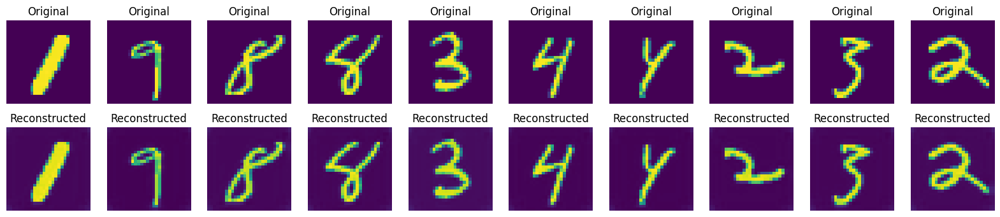

In [ ]:
# TODO : Plot some reconstructed images. Are they correct ?
def plot_reconstructed_images(model, test_loader):
    model.eval()
    with torch.no_grad():
        for batch in test_loader:
            x,_ = batch
            x_reconstructed = model(x)
            break
    fig, axes = plt.subplots(2, 10, figsize=(20, 4))
    for i in range(10):
        axes[0, i].imshow(x[i].permute(1, 2, 0))
        axes[0, i].axis('off')
        axes[0, i].set_title("Original")
        axes[1, i].imshow(x_reconstructed[i].permute(1, 2, 0))
        axes[1, i].axis('off')
        axes[1, i].set_title("Reconstructed")
    plt.show()

plot_reconstructed_images(model, test_loader)



##### Setting TensorBoard up

In [ ]:
!ls /content/tb_logs/my_model/version_0/

checkpoints  events.out.tfevents.1762855373.112e4ec7fe58.419.0	hparams.yaml


In [ ]:

%reload_ext tensorboard
%tensorboard --logdir "/content/tb_logs/my_model/version_0" # You might have to change the name of the folder, just look what folder were created on your Colab environment

<IPython.core.display.Javascript object>

### Going Further on AutoEncoders (Optional)

If you have some time, create other AutoEncoder with differnet latent sizes and train it.
* **What is the impact of the latent space toward the images reconstructions ?**

- Smaller Latent Space (fewer stacks): A smaller latent space forces the encoder to learn a more compressed representation of the data. This can lead to a higher reconstruction loss as the model has to discard more information. The reconstructed images might appear blurrier or lose some details.
- Larger Latent Space (more stacks): A larger latent space allows the encoder to retain more information, resulting in lower reconstruction loss and better image quality. However, a very large latent space might lead to the model simply memorizing the training data instead of learning a meaningful representation, which can hurt its ability to generalize to new images

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type        | Params | Mode 
----------------------------------------------
0 | model | AutoEncoder | 2.5 K  | train
1 | loss  | MSELoss     | 0      | train
----------------------------------------------
2.5 K     Trainable params
0         Non-trainable params
2.5 K     Total params
0.010     Total estimated model params size (MB)
26        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:484: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Average Reconstruction Loss (MSE): 0.0010


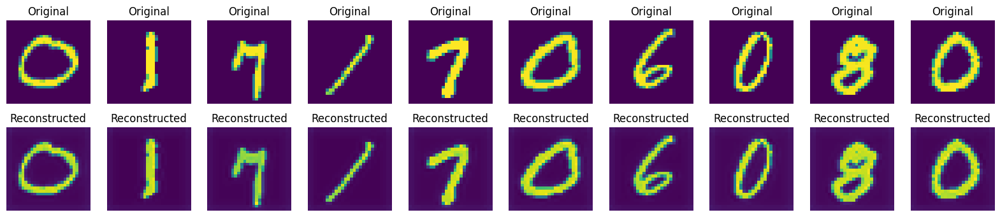

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type        | Params | Mode 
----------------------------------------------
0 | model | AutoEncoder | 48.9 K | train
1 | loss  | MSELoss     | 0      | train
----------------------------------------------
48.9 K    Trainable params
0         Non-trainable params
48.9 K    Total params
0.196     Total estimated model params size (MB)
46        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Average Reconstruction Loss (MSE): 0.0001


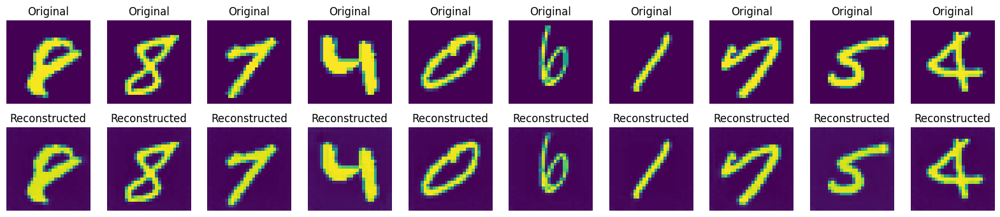

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type        | Params | Mode 
----------------------------------------------
0 | model | AutoEncoder | 3.1 M  | train
1 | loss  | MSELoss     | 0      | train
----------------------------------------------
3.1 M     Trainable params
0         Non-trainable params
3.1 M     Total params
12.595    Total estimated model params size (MB)
76        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Average Reconstruction Loss (MSE): 0.0188


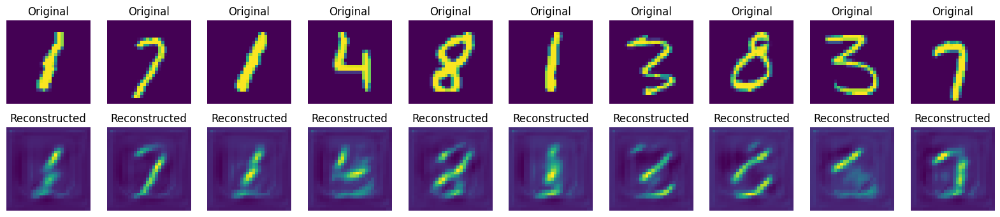

In [ ]:
# Latent sizes with differents number_of_stack
list_number_of_stack = [2, 4, 7]
models = [AutoEncoderPL(in_channels=1, number_of_stack=i) for i in list_number_of_stack]
dm = MNISTDataModule(batch_size=32)
for model in models:
  trainer = pl.Trainer(accelerator='auto', devices=1, max_epochs=10)
  trainer.fit(model, dm)
  average_reconstruction(model, test_loader)
  plot_reconstructed_images(model, test_loader)

## Industrial Application of GAN : Creating Google Maps Calque from Google Map Satellite view

Working on basic datasets such as MNIST is insightful but far from the reality you will face as an engineer. Let's turn to industrial datasets: given an image of a Google Map Satellite view, we want the model to predict a Calque view from it. This task is called image translation task.

For example, using the image on the left, we want the model to predict the image on the right.
<img src="https://eu42.github.io/images/gcgan/aerial_image_map_example.png" height = 200>


### Lightning DataModule



#### Dataset

First, we need to write the Dataset. As usual, a custom Dataset class must implement three functions:
* __init__
* __len__
* __getitem__

Each image's shape is 1200x600x3. The satellite and the calque has the same size and are exactly half of the image

As the dataset doesn't have a proper test dataset, we will use the validation dataset as the test set. We will further create a validation dataset by taking a portion of the train dataset

In [7]:
class GoogleDataset(Dataset):

  def __init__(self, path, transform = None):
    self.path = path
    self.images = [path + i for i in os.listdir(path)]
    self.transform = transform

  def __getitem__(self,idx):
    image = self.images[idx]
    full_image = cv2.imread(image)
    h,w,c = full_image.shape
    # TODO : Retrieve the correct parts of the image.
    satellite = full_image[:,:w//2,:]
    calque = full_image[:,w//2:,:]
    if self.transform :
      satellite = self.transform(satellite)
      calque = self.transform(calque)
    return {'satellite':satellite,
            'calque':calque}

  def __len__(self):
    return len(self.images)


#### Lightning DataModule

Now, let's prepare our DataModule.

In [8]:
class GoogleMapDataModule(pl.LightningDataModule):

    def __init__(self, batch_size):
        super().__init__()
        # TODO : In your Transformation, transform to Tensor and resize images to 128x128
        self.transform =  transforms.Compose([transforms.ToTensor(), transforms.Resize((128,128))])
        self.batch_size = batch_size

        # we are hardcoding the path are they won't change
        self.train_path = '/content/maps/train/'
        self.test_path = '/content/maps/val/'

    def prepare_data(self):
        # TODO : load the train and test dataset
        GoogleDataset(self.train_path, self.transform)
        GoogleDataset(self.test_path, self.transform)


    def setup(self, stage):

        #First stage is 'fit' (or None)
        if stage == "fit" or stage is None:
            # We create a validation split to watch the training.
            google_train = GoogleDataset(self.train_path, self.transform)
            train_size = int(0.7 * len(google_train ))
            test_size = len(google_train ) - train_size
            self.google_train, self.google_valid =  torch.utils.data.random_split(google_train , [train_size, test_size])
        #Second stage is 'test'
        if stage == "test" or stage is None:
            self.google_test = GoogleDataset(self.test_path, self.transform)

    def train_dataloader(self):
        # TODO : Now create your Training DataLoader
        return DataLoader(self.google_train, batch_size = self.batch_size, shuffle=True)

    def val_dataloader(self):
        # TODO : Now create your Validation DataLoader
        return DataLoader(self.google_valid, batch_size=self.batch_size)

    def test_dataloader(self):
        # TODO : Now create your Testing DataLoader
        return DataLoader(self.google_test, batch_size=self.batch_size)

### Lightning Module

* **Can we use an AutoEncoder to perform this task ?**

Yes, an AutoEncoder could be used for this image translation task. However, it might not be the most effective approach.

Regardless of your answer in the previous question, we choose to turn to a more complex model: Generative Adversarial Networks (**GAN**).

GAN is a type of generative model composed of two different sub-networks: the generator and the discriminator. It has been and is still in some applications one of the most efficient model for image generation tasks. We won't be working directly on a GAN but rather on its conditioned version (**cGAN**), which is very close in its learning process.


#### cGAN : Adding a Condition to the GAN
<img src='https://www.researchgate.net/profile/Gerasimos-Spanakis/publication/330474693/figure/fig1/AS:956606955139072@1605084279074/GAN-conditional-GAN-CGAN-and-auxiliary-classifier-GAN-ACGAN-architectures-where-x_Q320.jpg'>

 In contrast with a normal GAN, cGAN has a condition that will help us **control** how the GAN should generate images. The generator will be guided by the Condition during generation. For example, if you want to generate digits from the MNIST Dataset, you can add a condition to force the GAN to create a specific Digit. In the case of MNIST, the condition would be the class label.

Further details are in the following paper : https://arxiv.org/pdf/1411.1784.pdf


##### <u>The Generator</u> : Generating Images

In general, the Generator is here to generate Data from Noise. For example if we train a GAN on MNIST dataset, the generator will create digits using the noise we give it as input. In this lab, we are dealing with cGANs, so we need a Condition to condition our GAN.
* **What could be the condition in this task ?**

We are trying to perform image translation from a Google Map satellite view to a Google Map calque view.

To answer that :
* **What are we trying to do ?**
* **What should the Generator do ? Should it recreate something specific ?**


Yes, the Generator should create a calque image that corresponds to the input satellite image. It's not just creating a random calque; it needs to create a specific calque that accurately represents the features shown in the satellite view.

Let's use an AutoEncoder to perform the image translation.
* **Using previous classes, initialize your Generator using a 3 stack AutoEncoder.**

In [9]:
class Generator(nn.Module):
    # TODO : Create your Generator using the previous AutoEncoder Class
    def __init__(self,in_channels,number_of_stack):
        super().__init__()
        self.autoencoder = AutoEncoder(in_channels,number_of_stack)

    def forward(self,x):
        return self.autoencoder(x)


##### <u>The Discriminator</u> : Forcing the Generator to predict better

The generator is able to create Images from Inputs, but we want the best quality possible. We need a model that would indicate to the Generator whether the generated images are correct or not : the Discriminator.

The Discriminator is here to force the Generator to create better and better images. While the Generator creates bad quality generated image, the Discriminator will give a feedback.

<img src="https://i.imgflip.com/6y0kqe.jpg">

* **What could be the worst case scenario with the Generator and the Discriminator ?**
The worst-case scenario in the adversarial battle between the Generator and Discriminator in a GAN is when the training process fails to converge or falls into a state called mode collapse.

We provide you the code of a Discriminator that "works well".

In [10]:
class DiscriConv(nn.Module):
  def __init__(self, in_channels, out_channels, kernel_size):
    super().__init__()
    self.model = nn.Sequential(nn.Conv2d(in_channels = in_channels,
                                  out_channels = out_channels,
                                  kernel_size = kernel_size,
                                  stride = 2,
                                  padding = 1),
                                  nn.BatchNorm2d(out_channels),
                                  nn.LeakyReLU(0.2, inplace=True))

  def forward(self,x):
      return self.model(x)

class Discriminator(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential(DiscriConv(in_channels, 32,3),
                              DiscriConv(32, 64,4),
                              DiscriConv(64, 128,4),
                              # 128x4x4
                              nn.Conv2d(in_channels = 128,
                                        out_channels = out_channels,
                                        kernel_size = 3,
                                        bias=False))

  def forward(self, input):
    return self.main(input)

##### The Loss : Adversarial Battle

<!-- <img src="https://miro.medium.com/max/1400/1*d96q6bCKbmZT9Ls7f3X6xg.jpeg"> -->

$$\mathcal{L}_{cGAN}(G,D)=\mathbb{E}_{x,y}[\log D(x,y)]+\mathbb{E}_{x,z}[\log(1-D(x,G(x, z))]$$

$$\mathcal{L}_{L1}(G)=\mathbb{E}_{x,y,z}[\|y-G(x,z)\|_1] \qquad\text{ or }\qquad \mathcal{L}_{L2}(G)=\mathbb{E}_{x,y,z}(y-G(x,z))^2$$

This formula is the basic loss of the cGAN model. There are two terms, each optimizing specific part of the model.
Beautiful formulas, isn't it ? Let's properly understand them.
* What is x, y, z in our Case ?

x: The condition, which is the satellite image.

y: The real target image, which is the real calque image.

z: This term is typically random noise input to the generator in a standard GAN.

If we look at the formulas, there are two losses :
* What kind of losses are they ? Cross Entropies, Distance Losses ?
* Which term is the Discriminator loss ? Generator loss ?

$\mathcal{L}_{cGAN}(G,D)$: This is an adversarial loss. The terms $\log D(x,y)$ and $\log(1-D(x,G(x,z)))$ are based on the binary cross-entropy loss. The discriminator $D$ is trying to maximize this loss (correctly classify real and fake images), while the generator $G$ is trying to minimize the second term (fool the discriminator).
$\mathcal{L}*{L1}(G)$ or $\mathcal{L}*{L2}(G)$: These are distance losses. $\mathcal{L}*{L1}$ is the Mean Absolute Error (MAE), and $\mathcal{L}*{L2}$ is the Mean Squared Error (MSE). These losses measure the pixel-wise difference between the generated image $G(x,z)$ and the real image $y$.


* Which term is the Discriminator loss? Generator loss?

The Discriminator loss is primarily $\mathcal{L}_{cGAN}(G,D)$. The discriminator aims to maximize this function, which means correctly predicting that real pairs $(x,y)$ are real and fake pairs $(x, G(x,z))$ are fake.
The Generator loss is a combination of two parts:
The adversarial loss term $\mathbb{E}{x,z}[\log(1-D(x,G(x, z)))]$. The generator aims to minimize this, which is equivalent to maximizing $\mathbb{E}{x,z}[\log D(x,G(x, z))]$. This means the generator tries to fool the discriminator into thinking its generated images are real.
The distance loss $\mathcal{L}{L1}(G)$ or $\mathcal{L}{L2}(G)$. The generator also aims to minimize this loss, which encourages the generated image to be pixel-wise similar to the real target image. In the provided code, $\mathcal{L}_{L1}$ is used and weighted by 100.

The entire model will converge when the Generator provides the best generated fake images possible that the Discriminator won't be able to differentiate from the real images.

In [11]:
class GANLoss(nn.Module):
      def __init__(self, real_label=1, fake_label=0):
        super().__init__()
        self.loss = nn.BCEWithLogitsLoss()
        # Initialization a binary label, if real label 1, if fake label 0
        self.real_label = float(real_label)
        self.fake_label = float(fake_label)

      def get_labels(self, predictions, real_or_not):
          # TODO : If we have a real data as input, we want its target label to be self.real_label. If we have fake data as input, we want its target lable to be self.fake_label
          # Fill in the ...
          labels = self.real_label if real_or_not else self.fake_label
          return torch.tensor(labels).expand_as(predictions).to(predictions.device)

      def forward(self, predictions, real_or_not):
          # TODO : Return the Loss between the models prediction and the labels
          labels = self.get_labels(predictions, real_or_not)
          return self.loss(predictions, labels)
          return

##### The Final Module

Let's encompass everything under our Lightning Module. However, there are many steps to follow. In order to understand the code, read the commented parts.

In [32]:
class GAN(pl.LightningModule):
  def __init__(self ):
    super().__init__()
    # TODO : Initalize your Generator and Discriminator
    self.generator = Generator(in_channels = 3, # Satellite images have 3 channels (RGB)
                               number_of_stack = 3) # Using 3 stacks for better resolution
    self.discriminator = Discriminator(in_channels = 2*3, # Discriminator takes concatenated satellite and calque images (3 + 3 channels)
                                       out_channels = 1) # Discriminator outputs a single value (real or fake)
    self.criterion = GANLoss()
    self.criterionL1 = nn.L1Loss() # We add the L1 Loss for better correspondance between the colors
    self.automatic_optimization = False

  def forward(self,satellite):
    img_fake = self.generator(satellite)
    return img_fake

  def training_step(self, train_batch, batch_idx):
    # TODO:  Follow the steps
    satellite, calque = train_batch['satellite'], train_batch['calque']
    # Disclaimer : You might have to put some self. ...
    criterion = self.criterion
    criterionL1 = self.criterionL1 # We add the L1 Loss for better correspondance between the colors

    opt_generator, opt_discriminator = self.optimizers()

    # Discriminator Training Part
    # Goal : Train the Discriminator to differentiate fake and real data
    # Part 0 : Train on Fake data
    opt_discriminator.zero_grad()
    # TODO : Step 1 : Send the Satellite image through the generator to create a a Fake Calque
    fake_calque = self.generator(satellite)
    # Concatenating the Input Image and the Fake Generated Calque before sending to the Discriminator
    fake_data = torch.cat([satellite, fake_calque], dim = 1)
    # TODO : Step 2 : Send the fake data to the Discriminator
    fake_prediction = self.discriminator(fake_data.detach()) # Detach to avoid training the generator
    # Compute Loss
    loss_fake = criterion(fake_prediction, real_or_not = False) # In this case, we know that the Image are fake.
    # Part 1 : Train on Real data
    # TODO : Step 1 : Concatenate the Real Calque to the Satellite
    real_data = torch.cat([satellite, calque], dim = 1)
    # TODO : Step 2 : Send the Data through the Discriminator
    real_prediction = self.discriminator(real_data)
    # TODO : Compute the loss.
    loss_real = criterion(real_prediction, real_or_not = True)
    loss_discriminator =(loss_real + loss_fake)/2
    self.log('discriminator loss', loss_discriminator)
    self.manual_backward(loss_discriminator)
    opt_discriminator.step()


    # Generator Training Part
    # Goal : Train the Generator to create best Images
    opt_generator.zero_grad()
    # TODO : Step 1 : Send the Satellite image through the generator to create a a Fake Calque
    fake_calque = self.generator(satellite)
    fake_data = torch.cat([satellite, fake_calque], dim = 1)
    # TODO : Step 2 : Send the fake data to the Discriminator
    fake_prediction = self.discriminator(fake_data)
    # TODO : Step 3 : Compute the loss, don't forget that we want to create the best images possible, so what must be the value of real_or_not ?
    loss_true = criterion(fake_prediction, real_or_not = True) # We want the discriminator to think these are real
    loss_l1 = criterionL1(fake_calque, calque)* 100 # Adding the L1 Loss for color matching
    loss_generator = loss_true + loss_l1
    self.log('generator loss', loss_generator)
    self.manual_backward(loss_generator)
    opt_generator.step()


  def validation_step(self, val_batch, batch_idx):

    satellite, calque = val_batch['satellite'], val_batch['calque']
    criterion = self.criterion
    criterionL1 = self.criterionL1
    # TODO : Send the Satellite Image through the Generator
    fake_calque = self.generator(satellite)
    # TODO : Compute the Loss between the fake calque and the real calque
    loss_l1 = criterionL1(fake_calque, calque)

    # TODO : Send the fake calque, the satellite to the Discriminator, and compute the loss
    fake_data = torch.cat([satellite, fake_calque], dim = 1)
    fake_prediction = self.discriminator(fake_data)
    loss_fake = criterion(fake_prediction, real_or_not = False)

    # TODO : Send the real calque, the satellite to the Discriminator,and compute the loss
    real_data = torch.cat([satellite, calque], dim = 1)
    real_prediction = self.discriminator(real_data)
    loss_real = criterion(real_prediction, real_or_not = True)

    # TODO : Don't forget to log the losses
    self.log('val_loss_l1', loss_l1)
    self.log('val_loss_discriminator', (loss_real + loss_fake)/2)
    self.log('val_loss_generator', criterion(fake_prediction, real_or_not = True) + loss_l1*100)


  def test_step(self, test_batch, batch_idx):

    satellite, calque = test_batch['satellite'], test_batch['calque']
    criterion = self.criterion
    criterionL1 = self.criterionL1
    # TODO : Send the Satellite Image through the Generator
    fake_calque = self.generator(satellite)
    # TODO : Compute the Loss between the fake calque and the real calque
    loss_l1 = criterionL1(fake_calque, calque)

    # TODO : Send the fake calque, the satellite to the Discriminator, and compute the loss
    fake_data = torch.cat([satellite, fake_calque], dim = 1)
    fake_prediction = self.discriminator(fake_data)
    loss_fake = criterion(fake_prediction, real_or_not = False)

    # TODO : Send the real calque, the satellite to the Discriminator,and compute the loss
    real_data = torch.cat([satellite, calque], dim = 1)
    real_prediction = self.discriminator(real_data)
    loss_real = criterion(real_prediction, real_or_not = True)

    # TODO : Don't forget to log the losses
    self.log('test_loss_l1', loss_l1)
    self.log('test_loss_discriminator', (loss_real + loss_fake)/2)
    self.log('test_loss_generator', criterion(fake_prediction, real_or_not = True) + loss_l1*100)


  def configure_optimizers(self):
    # As we are optimizing to model, we will use 2 optimizer as the generator and discriminator
    # don't have the same architecture.
    optimizer_generator = torch.optim.Adam(self.generator.parameters(),
                                           lr=2e-4,
                                           betas= (0.005, 0.999))
    optimizer_discriminator = torch.optim.Adam(self.discriminator.parameters(),
                                           lr=2e-4,
                                           betas= (0.005, 0.999))
    # Lightning will take this list of generator along with the index of each optimizer
    return [optimizer_generator, optimizer_discriminator], []

  # def on_validation_epoch_end(self) -> None:
  #    return super().on_validation_epoch_end()

### Training

Train your model. We suggest you to train the model at least 10 epochs to see 'results'


In [33]:
datamodule = GoogleMapDataModule(batch_size=32)

In [34]:
model = GAN()
trainer = pl.Trainer(accelerator='auto', devices=1, max_epochs=10)
trainer.fit(model, datamodule)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type          | Params | Mode 
--------------------------------------------------------
0 | generator     | Generator     | 12.1 K | train
1 | discriminator | Discriminator | 167 K  | train
2 | criterion     | GANLoss       | 0      | train
3 | criterionL1   | L1Loss        | 0      | train
--------------------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.718

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [35]:
# Save the model checkpoint
trainer.save_checkpoint("gan_model.ckpt")
print("Model saved successfully!")

Model saved successfully!


In [36]:
# Load the model from the checkpoint
loaded_model = GAN.load_from_checkpoint("./gan_model.ckpt")

# You can now use the loaded_model for inference or further training
# For example, to use it for inference:
loaded_model.eval()
# Then pass your input data through the loaded_model
# output = loaded_model(input_data)

GAN(
  (generator): Generator(
    (autoencoder): AutoEncoder(
      (encoder): Encoder(
        (encoder): ModuleList(
          (0): ConvDown(
            (model): Sequential(
              (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
              (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): Dropout2d(p=0.5, inplace=False)
              (3): LeakyReLU(negative_slope=0.2)
            )
          )
          (1): ConvDown(
            (model): Sequential(
              (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
              (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): Dropout2d(p=0.5, inplace=False)
              (3): LeakyReLU(negative_slope=0.2)
            )
          )
          (2): ConvDown(
            (model): Sequential(
              (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
              (1): BatchNorm2d(32, eps=1e-05, momentu

### Testing

Test your model on few images of the test dataset. You can further try the model by cropping Satellite views from Google Maps

size of satellite image :
torch.Size([32, 3, 128, 128])
size of real calque image :
torch.Size([32, 3, 128, 128])


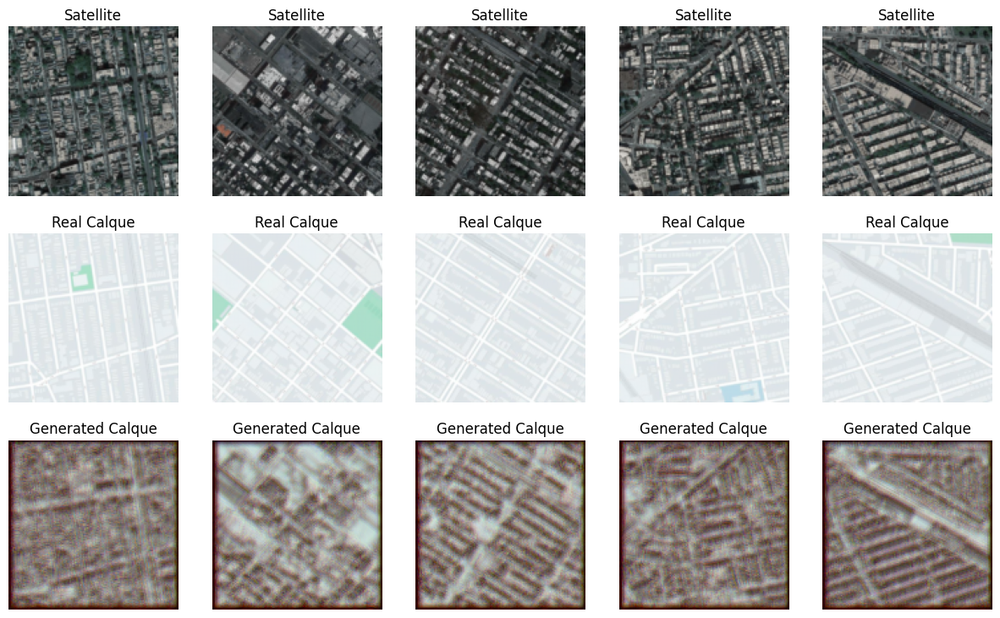

In [37]:
# TODO: Load your test dataloader from the datamodule
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()

# TODO: Get some sample images from the test set
dataiter = iter(test_loader)
sample_batch = next(dataiter)
# satellite_images, real_calque_images = sample_batch # Incorrect unpacking
satellite_images = sample_batch['satellite']
real_calque_images = sample_batch['calque']


print("size of satellite image :")
print(satellite_images.shape)
print("size of real calque image :")
print(real_calque_images.shape)


# TODO: Get the model's predictions
loaded_model.eval()
with torch.no_grad():
    fake_calque_images = loaded_model(satellite_images)

# TODO: Plot original satellite, real calque, and generated fake calque images
def plot_gan_samples(satellite, real_calque, fake_calque, num_samples=5):
    fig, axes = plt.subplots(3, num_samples, figsize=(15, 9))
    for i in range(num_samples):
        axes[0, i].imshow(satellite[i].permute(1, 2, 0).cpu().numpy())
        axes[0, i].set_title("Satellite")
        axes[0, i].axis('off')

        axes[1, i].imshow(real_calque[i].permute(1, 2, 0).cpu().numpy())
        axes[1, i].set_title("Real Calque")
        axes[1, i].axis('off')

        # Ensure the fake_calque_images have the correct shape for plotting
        fake_calque_display = fake_calque[i].permute(1, 2, 0).cpu().numpy()
        # Clip values to be in the valid range [0, 1] for imshow
        fake_calque_display = np.clip(fake_calque_display, 0, 1)
        axes[2, i].imshow(fake_calque_display)
        axes[2, i].set_title("Generated Calque")
        axes[2, i].axis('off')
    plt.show()

plot_gan_samples(satellite_images, real_calque_images, fake_calque_images)